# Integration

**Import**

In [1]:
# from second tutorial notebook (Part02)
import scanpy as sc
import pandas as pd
import scvelo as scv
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import ipywidgets as widgets

# others
import re
import os

# first tutorial
import bbknn
import diffxpy.api as dxpy
import plotly.express as px

# Meritxell's
import anndata2ri

In [2]:
# Meritxell's normalization
# Activate the anndata2ri conversion between SingleCellExperiment and AnnData
anndata2ri.activate()

#Loading the rpy2 extension enables cell magic to be used
#This runs R code in jupyter notebook cells
%load_ext rpy2.ipython

sc.settings.verbosity = 3
#sc.logging.print_versions()

In [4]:
bon_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/BON/cluster_adata.h5ad'
chimp_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/CHIMP/cluster_adata.h5ad' 
gor_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/GOR/cluster_adata.h5ad'
mac_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/MAC/cluster_adata.h5ad'
hum_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/HUM/cluster_adata.h5ad'

In [5]:
bon = sc.read(bon_path)
chimp = sc.read(chimp_path)
gor = sc.read(gor_path)
mac = sc.read(mac_path)
hum = sc.read(hum_path)

In [6]:
bon

AnnData object with n_obs × n_vars = 5043 × 25535
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'DATASET_colors', 'DE_leiden', 'DE_leiden_celltype', 'hvg', 'leiden', 'leiden_R.1_colors', 'leiden_R.2_colors', 'leiden_R.3_colors', 'neighbors', 'pca', 'spermatogenesis_

In [7]:
bon.obs['species']='bon'
chimp.obs['species']='chimp'
gor.obs['species']='gor'
mac.obs['species']='mac'
hum.obs['species']='hum'

In [8]:
bon.obs['species']

SN219_AAACCTGAGAAAGTGG    bon
SN219_AAACCTGAGGCGCTCT    bon
SN219_AAACCTGAGTCGCCGT    bon
SN219_AAACCTGCAGCGTTCG    bon
SN219_AAACCTGGTAAGAGAG    bon
                         ... 
SN224_TTTGTCAAGGGATCTG    bon
SN224_TTTGTCAAGTGAACGC    bon
SN224_TTTGTCACAGTAGAGC    bon
SN224_TTTGTCACATCCTTGC    bon
SN224_TTTGTCATCCGCAGTG    bon
Name: species, Length: 5043, dtype: object

In [9]:
merged = bon.concatenate(chimp)

In [10]:
merged

AnnData object with n_obs × n_vars = 21293 × 25353
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types', 'species', 'leiden_R.4'
    var: 'feature_types', 'chromosome', 'gene_ids-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_umap'
    layers: 'no

In [11]:
merged = merged.concatenate(gor)

In [12]:
merged = merged.concatenate(mac)

In [13]:
merged = merged.concatenate(hum)

In [3]:
merged = sc.read('/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/merged_adata.h5ad')

In [15]:
category_order=['Undif. SG','Dif. SG','SC.I','SC.II','Early round SD','Late round SD','Elong. SD','Sertoli']

In [16]:
palette_dict = {"Undif. SG":'lightblue',"Dif. SG":'blue',"SC.I":'lightgreen','SC.II':'green','Early round SD':'yellow','Late round SD':'orange','Elong. SD':'red','Sertoli':'pink','Macrophage':'brown'}

In [17]:
fig = px.histogram(merged.obs['spermatogenesis_types'], x='spermatogenesis_types', color='spermatogenesis_types', color_discrete_map=palette_dict)
fig.update_layout(
    xaxis=dict(
        categoryorder='array',
        categoryarray=category_order   
    ),
    autosize=False,
    width=800,
    #bargap=0.1,
    #bargroupgap=0.1
)
fig.show()

In [18]:
merged.X = merged.layers['raw_counts'].copy() # raw counts matrix as default

In [19]:
merged.X

array([[0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [1.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       ...,
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 1.      , 0.      ],
       [1.5     , 0.      , 0.666667, ..., 0.      , 0.      , 0.      ]],
      dtype=float32)

In [20]:
merged.layers['norm_sct']

array([[-0.38624061, -0.11852944, -0.12604581, ..., -0.17378488,
        -0.08765947, -0.32689791],
       [ 3.37791163, -0.10156935, -0.11268939, ..., -0.13910251,
        -0.074139  , -0.28549243],
       [-0.52358889, -0.18076913, -0.17449822, ..., -0.30137505,
        -0.13673458, -0.47723768],
       ...,
       [-0.64616885, -0.35659267, -0.3500357 , ..., -1.71793412,
        -0.6390978 , -1.58339863],
       [-0.41238667, -0.25243207, -0.22941105, ..., -1.49997995,
         5.4050304 , -1.37393625],
       [ 0.64783157, -0.39073874,  1.38546934, ..., -1.78099892,
        -0.67802806, -1.64582601]])

In [21]:
merged

AnnData object with n_obs × n_vars = 46782 × 20350
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types', 'leiden_R.4', 'leiden_R.5', 'species'
    var: 'feature_types', 'chromosome', 'gene_ids-Bon', 'n_cells-Bon', 'highly_variable-Bon', 'means-Bon', 'dispersions-Bon', 'dispersions_norm-Bon', 'gene_ids-Chimp', 'n_cells-Chimp', 'highly_variable-Chimp', 'means-Chimp', 'dispersions-Chimp', 'dispersions_norm-

In [4]:
#rawMatrix = merged.X.todense().T
rawMatrix = merged.X.T # T switch axis of cells and genes
cells = merged.obs_names
genes = merged.var_names
dataset = np.array(merged.obs["DATASET"])
species = np.array(merged.obs["species"])

In [5]:
rawMatrix.shape

(20350, 46782)

In [6]:
# normalization with all species combined
# "vars.to.regress" is still batch, it includes species now 

In [7]:
%%R -i rawMatrix -i cells -i genes -i species -o norm_sct -o umi_corr -o genes_var

library(Seurat)
colnames(rawMatrix) <- cells
rownames(rawMatrix) <- genes
meta <- data.frame(species = species)  # add batch as metadata
print(dim(rawMatrix))
seurat_df <- CreateSeuratObject(rawMatrix)
seurat_df <- AddMetaData(seurat_df, meta$species, col.name = "species")
# scTransform
seurat_df <- SCTransform(seurat_df, verbose = TRUE, variable.features.n = length(genes), vars.to.regress = c("species"), return.only.var.genes=FALSE) # normalize data with Negative binomial regression
# Get matrix of residuals
norm_sct <- GetAssayData(seurat_df,assay="SCT",slot="scale.data") # assign normalized and scaled data (not 0 mean scaling)
umi_corr <- GetAssayData(seurat_df,assay="SCT",slot="counts")
genes_var <- rownames(seurat_df$SCT)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: Attaching SeuratObject



[1] 20350 46782


R[write to console]: Calculating cell attributes from input UMI matrix: log_umi

R[write to console]: Error in make_cell_attr(umi, cell_attr, latent_var, batch_var, latent_var_nonreg,  : 
  cell attribute "log_umi" contains NA, NaN, or infinite value

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In make_cell_attr(umi, cell_attr, latent_var, batch_var, latent_var_nonreg,  :
R[write to console]: 
 
R[write to console]:  NaNs produced




Error in make_cell_attr(umi, cell_attr, latent_var, batch_var, latent_var_nonreg,  : 
  cell attribute "log_umi" contains NA, NaN, or infinite value


RInterpreterError: Failed to parse and evaluate line '\nlibrary(Seurat)\ncolnames(rawMatrix) <- cells\nrownames(rawMatrix) <- genes\nmeta <- data.frame(species = species)  # add batch as metadata\nprint(dim(rawMatrix))\nseurat_df <- CreateSeuratObject(rawMatrix)\nseurat_df <- AddMetaData(seurat_df, meta$species, col.name = "species")\n# scTransform\nseurat_df <- SCTransform(seurat_df, verbose = TRUE, variable.features.n = length(genes), vars.to.regress = c("species"), return.only.var.genes=FALSE) # normalize data with Negative binomial regression\n#\xa0Get matrix of residuals\nnorm_sct <- GetAssayData(seurat_df,assay="SCT",slot="scale.data") # assign normalized and scaled data (not 0 mean scaling)\numi_corr <- GetAssayData(seurat_df,assay="SCT",slot="counts")\ngenes_var <- rownames(seurat_df$SCT)\n'.
R error message: 'Error in make_cell_attr(umi, cell_attr, latent_var, batch_var, latent_var_nonreg,  : \n  cell attribute "log_umi" contains NA, NaN, or infinite value'

In [ ]:
merged.var_names = ["-".join(x.split("_")) for x in merged.var_names] # change _ in gene names to - so it works in R code
merged = merged[:,np.array(genes_var)].copy() # only use genes ...
# creating SCT layers in anndata object
merged.layers["norm_sct"] = norm_sct.T
merged.layers["umi_corr"] = umi_corr.T

In [ ]:
merged.X = merged.layers['norm_sct'].copy()

In [28]:
merged.X

array([[-0.21805742, -0.09203298, -0.02531131, ...,  0.01228482,
         0.01095574, -0.06226564],
       [ 2.47767271, -0.07227755,  0.00514791, ...,  0.08303641,
         0.04746532,  0.00856078],
       [-0.39708129, -0.16464561, -0.13619016, ..., -0.1974069 ,
        -0.12133827, -0.27189241],
       ...,
       [-1.21838021, -0.55287391, -0.40935189, ..., -1.37600399,
        -0.59175566, -1.23140072],
       [-1.03869837, -0.48388036, -0.30328876, ..., -1.12227885,
         4.80086162, -0.97731866],
       [ 1.29492966, -0.57031425,  1.59453554, ..., -1.43034803,
        -0.62381502, -1.2857472 ]])

In [61]:
sc.pp.highly_variable_genes(merged, n_top_genes=10000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:18)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [63]:
sc.tl.pca(merged)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:52)


In [64]:
merged.uns['pca']

{'params': {'zero_center': True, 'use_highly_variable': True},
 'variance': array([196.76278006, 130.69648639,  65.48893649,  63.60150761,
         39.91271737,  37.80050291,  29.68843961,  26.15570337,
         22.59242327,  19.30690966,  17.30508577,  16.64506615,
         15.20338338,  14.36574451,  12.83182098,  12.75520395,
         11.60050538,  11.09684966,  10.99710539,  10.15384935,
          9.97285425,   9.73816942,   9.21533871,   8.89793982,
          8.49729068,   8.07906621,   7.83443984,   7.51084025,
          7.11817287,   6.74919149,   6.5520827 ,   6.37702885,
          6.04742987,   5.99661226,   5.7399739 ,   5.6240868 ,
          5.49078345,   5.28168682,   5.20886331,   5.02683707,
          4.89770211,   4.75547837,   4.69709872,   4.48416464,
          4.46831668,   4.37083199,   4.34667745,   4.28492668,
          4.12122957,   4.05564492]),
 'variance_ratio': array([0.01896605, 0.01259789, 0.00631251, 0.00613058, 0.0038472 ,
        0.00364361, 0.00286168, 0

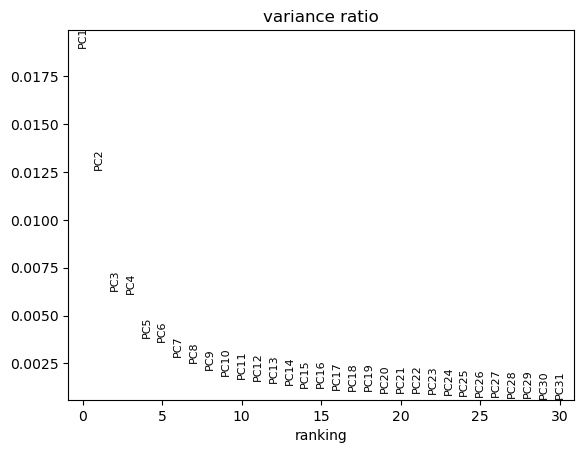

In [66]:
sc.plotting.pca_variance_ratio(merged) # small variance means it probably models noice in the data

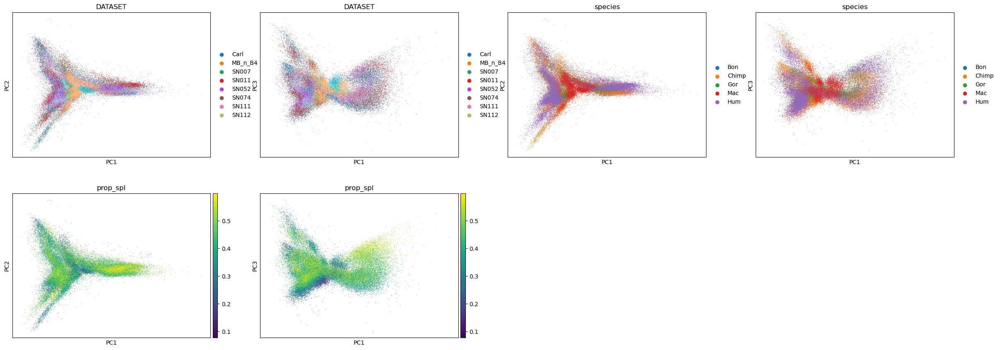

In [67]:
sc.pl.pca(merged, color=['DATASET','species','prop_spl'], components=['1,2','1,3'])

In [68]:
bbknn.bbknn(merged, batch_key='species', n_pcs=20, neighbors_within_batch=3)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:05)


In [ ]:
sc.tools.umap(merged, random_state=54321)

computing UMAP


In [ ]:
# batch_key = species
sc.plotting.umap(merged, color=['DATASET','species','spermatogenesis_types'])

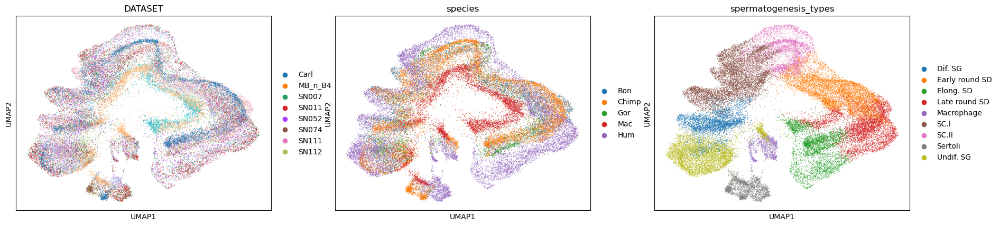

In [42]:
# batch_key = dataset
sc.plotting.umap(merged, color=['DATASET','species','spermatogenesis_types'])

In [ ]:
%run /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial/Scripts/pythonScripts.py

In [2]:
# markers in article and course mixed
markers = dict() #make an empty dictionary
#markers['SpermatogoniaB'] = ['MKI67','DMRT1','STRA8'] 
### SPERMATOCYTOGENESIS
markers['Undif. SG'] = ['ID4','HMGA1'] # course
markers['Dif. SG'] = ['MKI67','DMRT1','STRA8'] # course
markers['SC.I'] = ['MEIOB','PRSS50','SYCP1','TEX101'] # course
markers['SC.II'] = ['PIWIL1','ACRV1','SPATA16','CLGN'] # course
### SPERMIOGENESIS
markers['Early round SD'] = ['LRRIQ1'] #Round spermatids, Distinct #better than tutorial
markers['Late round SD'] = ['ACRV1','SPACA1'] #Round spermatids, Distinct #better than tutorial
markers['Elong SD'] = ['SPATA3','NRBP1','PRM1','GABBR2'] #Elongated spermatids #better than tutorial
### SOMATIC CELLS
markers['Sertoli'] = ['CLU'] # very distinct #better than tutorial
markers['Macroph'] = ['APOE','CD74']
markers['Leydig'] = ['STAR','CYP11A1']
markers['Endothelial'] = ['CD34'] #'TM4SF1' not expressed

In [7]:
markers_scores, merged = marker_score(markers, merged)

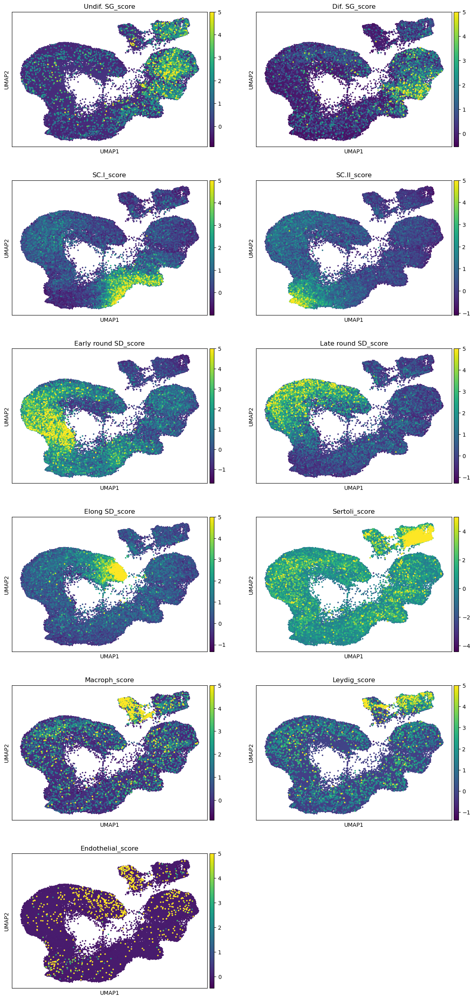

In [9]:
sc.plotting.umap(merged, color=markers_scores, components=['1,2'], ncols=2, vmax=5, s=30)

In [55]:
adata_out = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/merged_norm_adata.h5ad'

In [56]:
merged.write(adata_out)